In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def get_marker_scale(image_path, marker_size_mm=3.0):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image not found")

    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Initialize the ArUco dictionary and detector parameters
    aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
    parameters = cv2.aruco.DetectorParameters()

    # Detect ArUco markers
    corners, ids, _ = cv2.aruco.detectMarkers(gray_image, aruco_dict, parameters=parameters)

    if ids is not None and len(corners) > 0:
        # Assuming the ArUco marker is square, measure the size of the first detected marker
        first_marker = corners[0].squeeze() 
        top_left, top_right = first_marker[0], first_marker[1]

        # Calculate pixel distance between the top corners of the first marker
        marker_size_pixels = np.linalg.norm(top_right - top_left)

        # Calculate the pixels-per-millimeter scale
        pixels_per_mm = marker_size_pixels / marker_size_mm

        return pixels_per_mm, marker_size_pixels
    else:
        raise ValueError("No ArUco markers detected")
    

def showMarkers(image, corners, channel=3):
    '''Display marker on image'''
    image_copy = image.copy()
    for corner in corners:
        topLeft = corner[0][0].astype('int')
        topRight = corner[0][1].astype('int')
        bottomRight = corner[0][2].astype('int')
        bottomLeft = corner[0][3].astype('int')
        cv2.line(image_copy, tuple(topLeft), tuple(bottomLeft), (0, 0, 255), 10)
        cv2.line(image_copy, tuple(topLeft), tuple(topRight), (0, 0, 255), 10)
        cv2.line(image_copy, tuple(bottomLeft), tuple(bottomRight), (0, 0, 255), 10)
        cv2.line(image_copy, tuple(bottomRight), tuple(topRight), (0, 0, 255), 10)
    plt.imshow(image_copy[:, :, ::-1]) if channel == 3 else plt.imshow(image_copy, cmap='gray')
    plt.show()

def crop_image_to_markers(original_image, corners):
    '''Crop the original image to the area defined by ArUco markers'''
    # Flatten the array of corners
    all_corners = np.concatenate(corners).reshape(-1, 2)

    # Since the image was downsampled twice, each downsample reduces the size by half
    scale_factor = 4  # 2 downsamples = 2^2 = 4

    # Adjust corners to the original image scale
    all_corners *= scale_factor

    # Find the minimum and maximum coordinates on both axes
    top_left = np.min(all_corners, axis=0).astype(int)
    bottom_right = np.max(all_corners, axis=0).astype(int)

    # Crop the image using the extreme corners
    cropped_image = original_image[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
    return cropped_image

def calculate_pixel_scale_on_downsampled(image, marker_size_mm=3.0):
    '''Calculate the pixel scale on the downsampled image'''
    original_image = cv2.imread(image)
    if original_image is None:
        raise ValueError("Image not found")

    # Downsample the image twice for detection
    downsampled_image = cv2.pyrDown(original_image)
    downsampled_image = cv2.pyrDown(downsampled_image)

    # Convert to grayscale
    gray_image = cv2.cvtColor(downsampled_image, cv2.COLOR_BGR2GRAY)

    # Initialize the ArUco dictionary
    aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)

    # Detect ArUco markers
    corners, ids, rejected = cv2.aruco.detectMarkers(gray_image, aruco_dict)

    if ids is not None and len(corners) == 4:
        # Assuming the ArUco marker is square, measure the size of the first detected marker
        first_marker = corners[0][0]
        top_left, top_right = first_marker[0], first_marker[1]

        # Calculate pixel distance between the top corners of the first marker
        marker_size_pixels = np.linalg.norm(top_right - top_left)

        # Since we downsampled twice, the scale factor is 4
        scale_factor = 4

        # Adjust marker size in pixels for downsampling
        marker_size_pixels *= scale_factor

        # Calculate the pixels-per-millimeter scale based on the original image
        pixels_per_mm = marker_size_pixels / marker_size_mm
        return pixels_per_mm, marker_size_pixels, corners
    else:
        raise ValueError(f"Expected 4 ArUco markers, but found {len(corners)}")


def find_wing_tip(cropped_image, pixels_per_mm, marker_size_mm=3.0, margin_ratio=0.23):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    # Use Canny edge detection to find edges in the image
    edges = cv2.Canny(gray_image, threshold1=100, threshold2=150)

    # Calculate the margins as a ratio of the image height
    image_height = cropped_image.shape[0]
    top_margin = int(image_height * margin_ratio)
    bottom_margin = image_height - top_margin


    # Initialize wing tip position
    wing_tip_x = None
    wing_tip_y = None

    # Start scanning from the left, but skip the area with the markers plus additional margin
    for x in range(0, edges.shape[1]):
        # Scan vertically between the margins
        vertical_middle = edges[top_margin:bottom_margin, x]

        # Check if we find an edge, indicating the wing edge
        if np.any(vertical_middle > 0):
            wing_tip_x = x
            wing_tip_y = np.argmax(vertical_middle) + top_margin
            break

    # Draw a circle at the wing tip position if found
    if wing_tip_x is not None:
        cv2.circle(cropped_image, (wing_tip_x, wing_tip_y), radius=20, color=(0, 0, 255), thickness=3)  # Red circle
        plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
        plt.title('Cropped Image with Wing Tip Marked')
        plt.axis('off')
        plt.show()
        return wing_tip_x, wing_tip_y
    else:
        plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
        plt.title('Cropped Image with Margins (Wing Tip Not Found)')
        plt.axis('off')
        plt.show()
        return None, None


def calculate_wing_length(cropped_image, wing_tip_x, pixels_per_mm):
    # The right edge of the image is the end of the wing
    right_edge_x = cropped_image.shape[1]

    # The length of the wing in pixels is the difference between the wing tip and the right edge
    wing_length_pixels = right_edge_x - wing_tip_x

    # Convert the wing length from pixels to millimeters
    wing_length_mm = wing_length_pixels / pixels_per_mm

    return wing_length_mm


Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data
Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Habropoda tristissima
Processing file: UCSB-IZC00010408_L.JPG


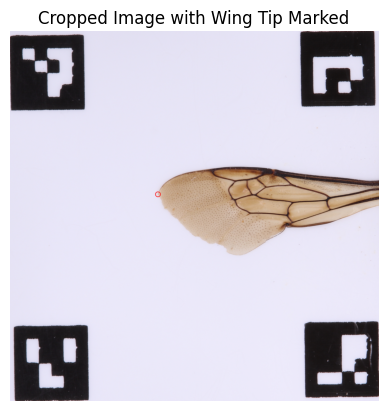

Processing file: UCSB-IZC00009181_R.JPG


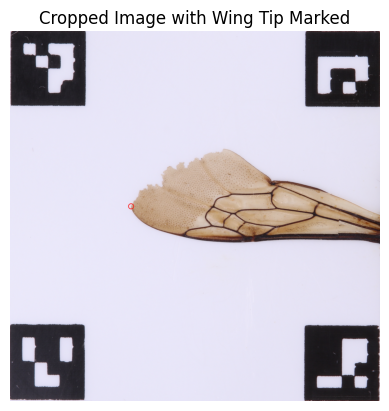

Processing file: UCSB-IZC00010408_R.JPG


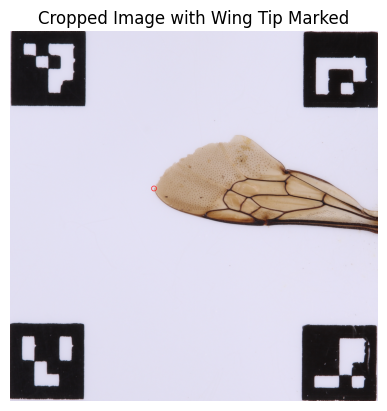

Processing file: UCSB-IZC00009181_L.JPG


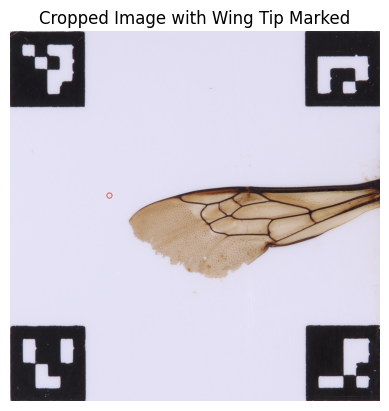

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Diadasia bituberculata
Processing file: UCSB-IZC00037492_R.JPG


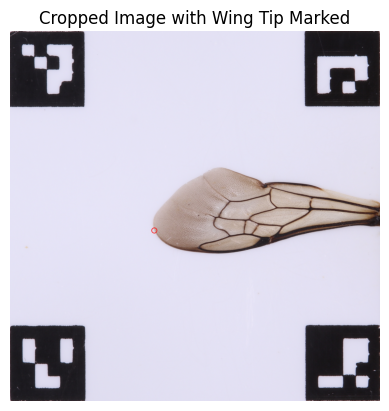

Processing file: UCSB-IZC00037255_L.JPG


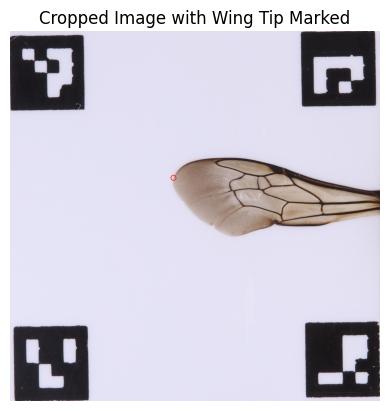

Processing file: UCSB-IZC00038762_R.JPG


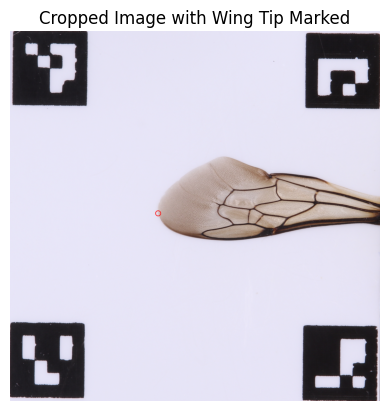

Processing file: UCSB-IZC00041916_L.JPG


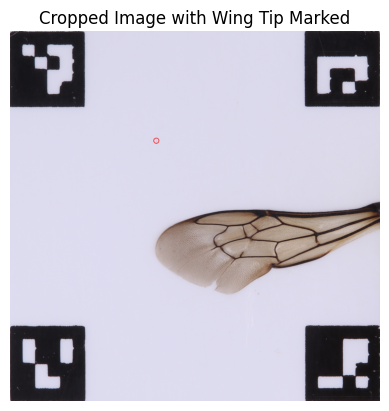

Processing file: UCSB-IZC00031299_R.JPG


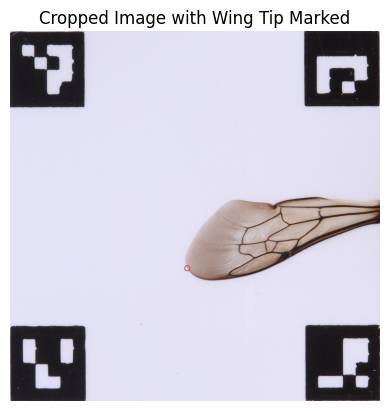

Processing file: UCSB-IZC00030264_R.JPG


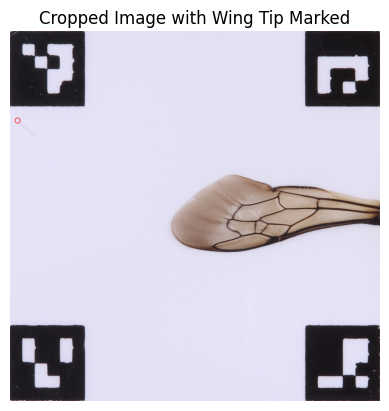

Processing file: UCSB-IZC00040929_L.JPG


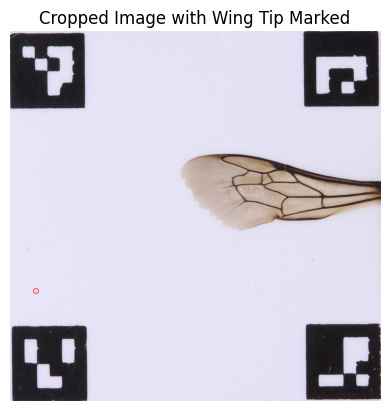

Processing file: UCSB-IZC00037347_R.JPG


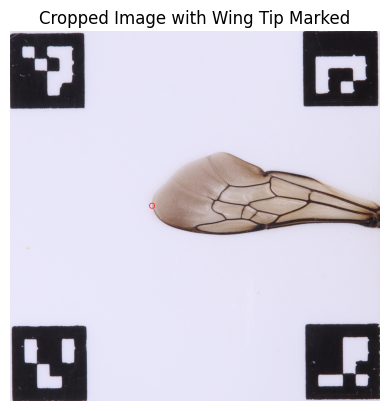

Processing file: UCSB-IZC00038796_L.JPG


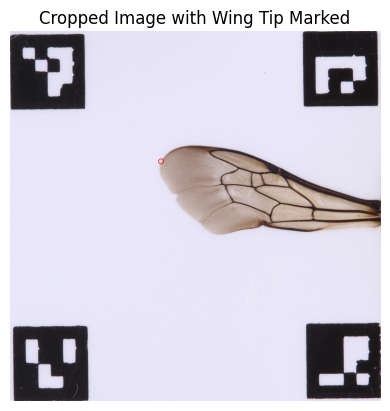

Processing file: UCSB-IZC00041916_R.JPG


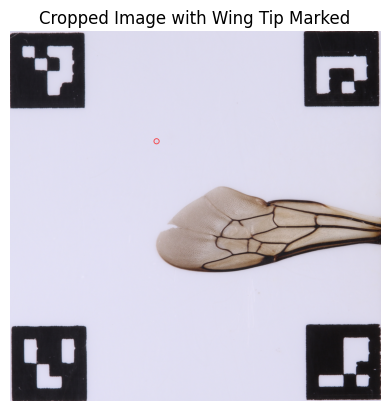

Processing file: UCSB-IZC00031299_L.JPG


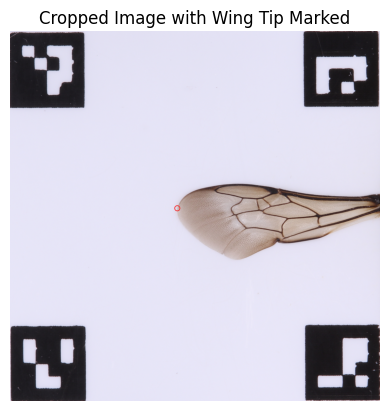

Processing file: UCSB-IZC00030264_L.JPG


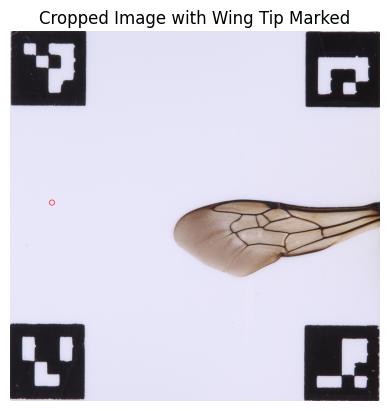

Processing file: UCSB-IZC00040929_R.JPG


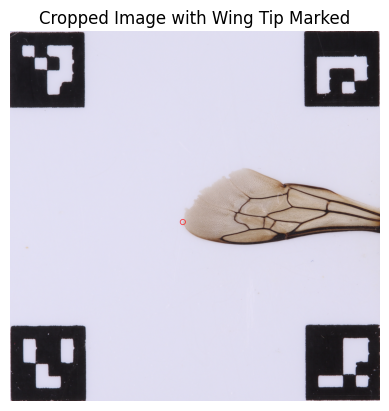

Processing file: UCSB-IZC00037347_L.JPG


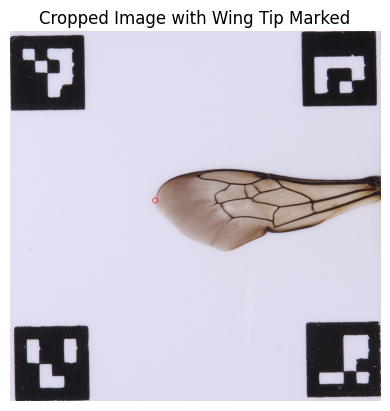

Processing file: UCSB-IZC00038796_R.JPG


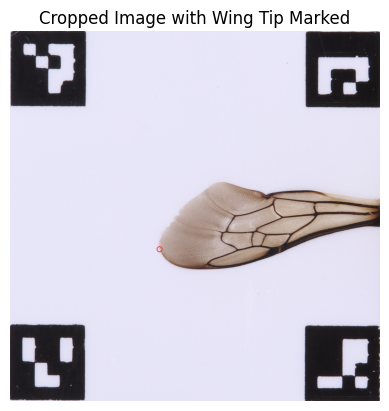

Processing file: UCSB-IZC00037492_L.JPG


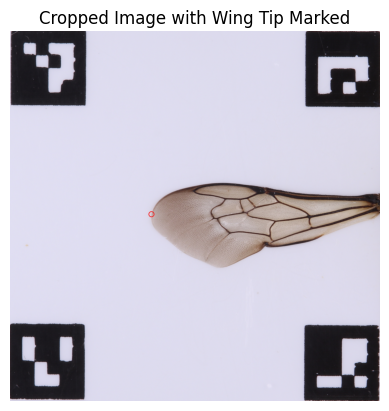

Processing file: UCSB-IZC00037255_R.JPG


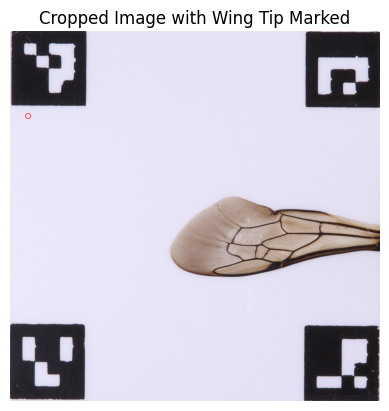

Processing file: UCSB-IZC00038762_L.JPG


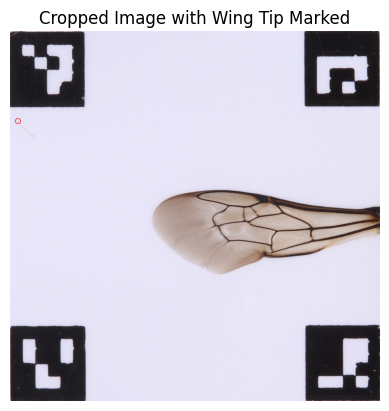

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Osmia atrocyanea
Processing file: EMEC939046_R.JPG


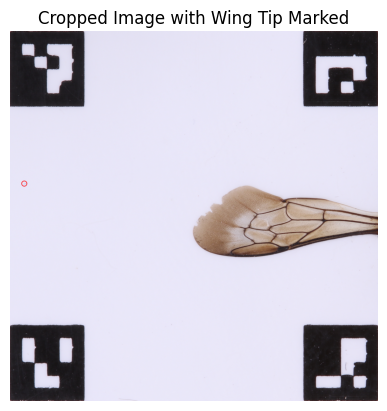

Processing file: UCSB-IZC00014690_R.JPG


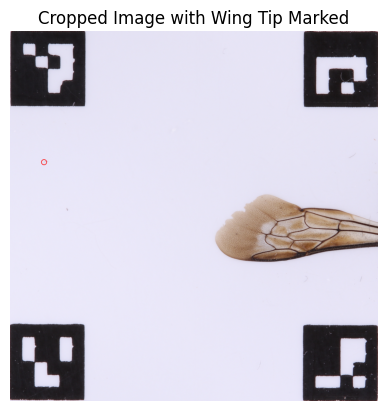

Processing file: UCSB-IZC00014690_L.JPG


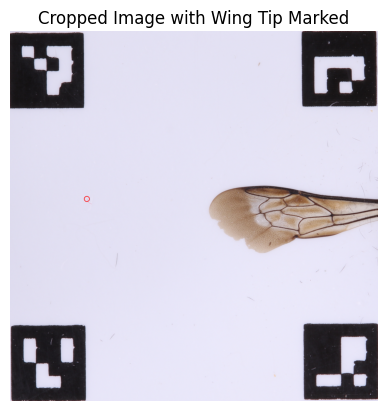

Processing file: EMEC939046_L.JPG


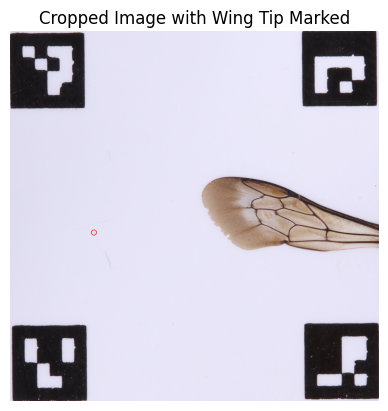

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Bombus sonorus
Processing file: UCSB-IZC00010472_L.JPG


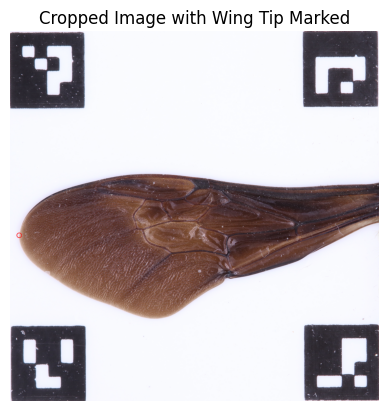

Processing file: UCSB-IZC00009072_L.JPG


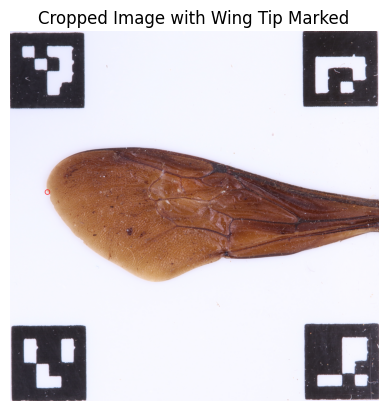

Processing file: UCSB-IZC00010497_L.JPG


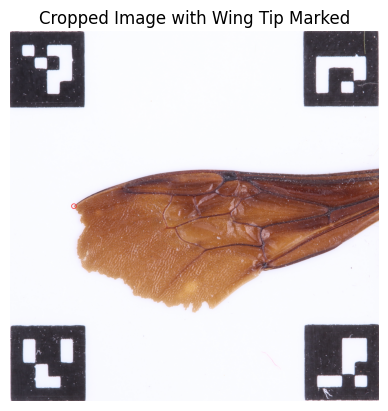

Processing file: UCSB-IZC00009832_L.JPG


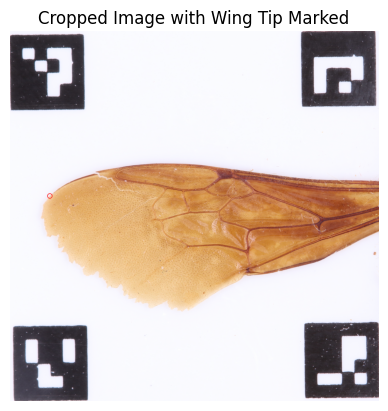

Processing file: UCSB-IZC00009816_L.JPG


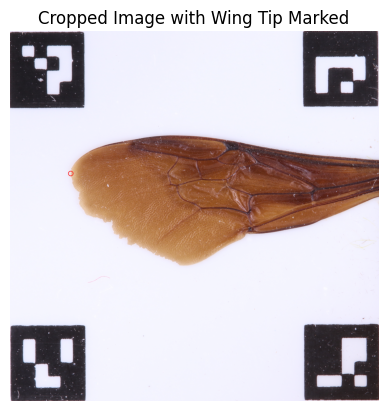

Processing file: UCSB-IZC00010527_R.JPG


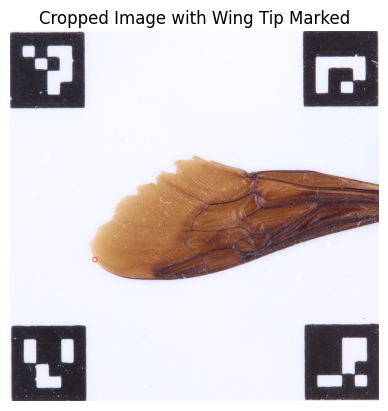

Processing file: UCSB-IZC00009832_R.JPG


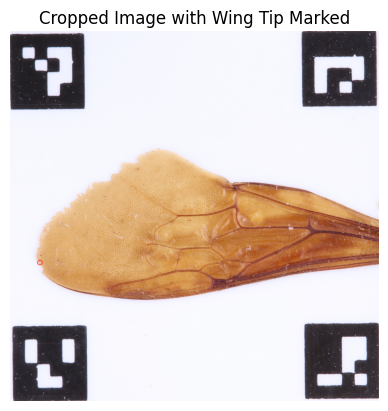

Processing file: UCSB-IZC00009816_R.JPG


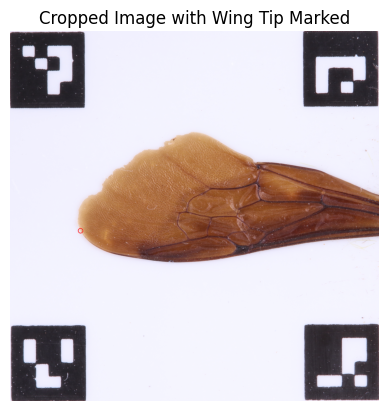

Processing file: UCSB-IZC00010527_L.JPG


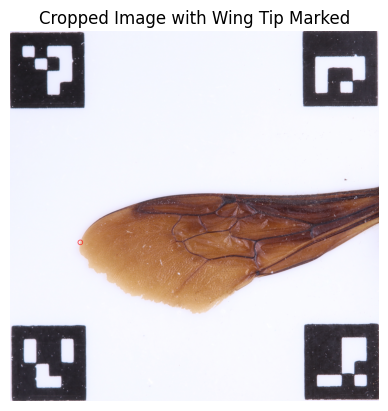

Processing file: UCSB-IZC00010472_R.JPG
Error processing image UCSB-IZC00010472_R.JPG: Expected 4 ArUco markers, but found 3
Processing file: UCSB-IZC00009072_R.JPG


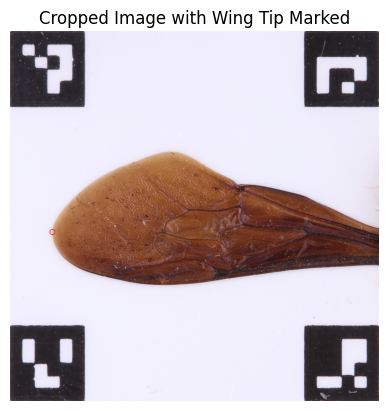

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Megachile onobrychidis
Processing file: UCSB-IZC00035449_L.JPG


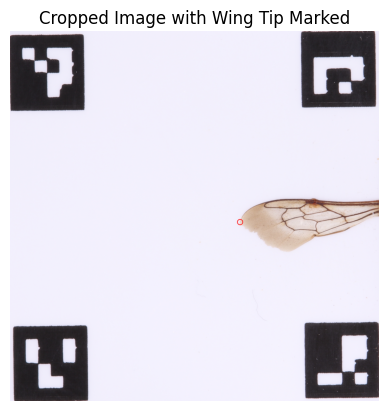

Processing file: UCSB-IZC00035449_R.JPG


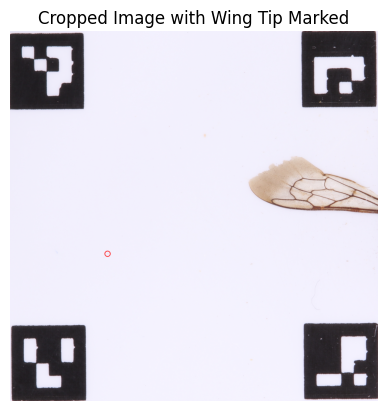

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Diadasia australis
Processing file: UCSB-IZC00039458_R.JPG


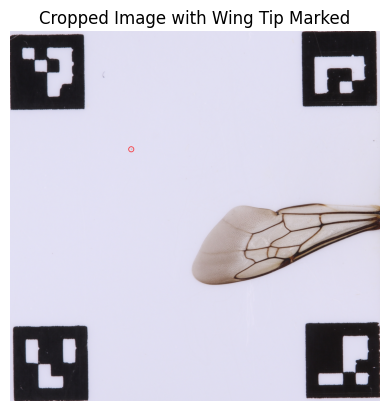

Processing file: UCSB-IZC00039458_L.JPG


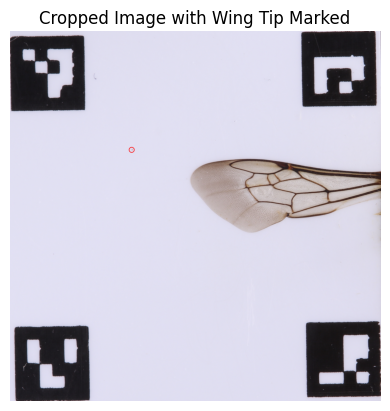

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Osmia aglaia
Processing file: UCSB-IZC00009986_R.JPG


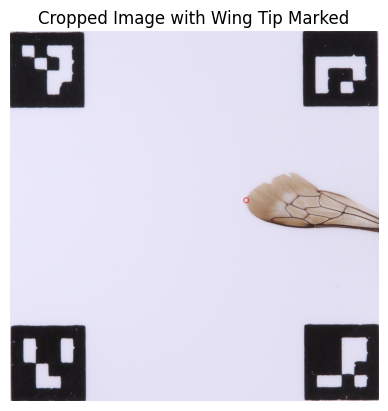

Processing file: UCSB-IZC00009986_L.JPG


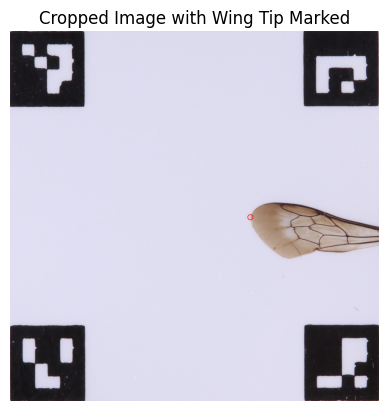

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Megachile texana
Processing file: UCSB-IZC00010811_R.JPG


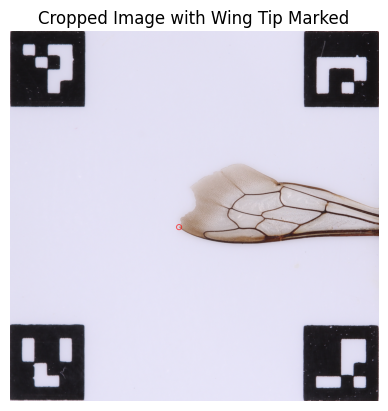

Processing file: UCSB-IZC00010811_L.JPG


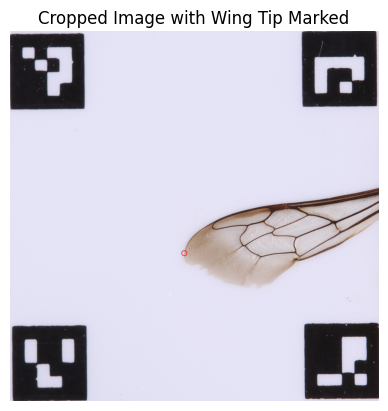

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Habropoda depressa
Processing file: UCSB-IZC00041391_L.JPG


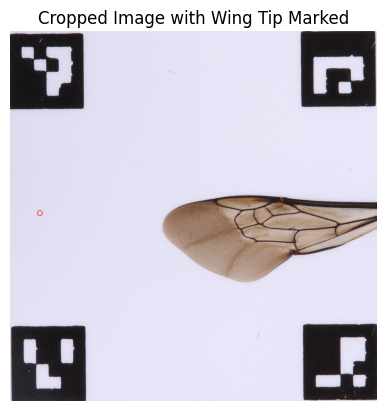

Processing file: UCSB-IZC00014915_L.JPG


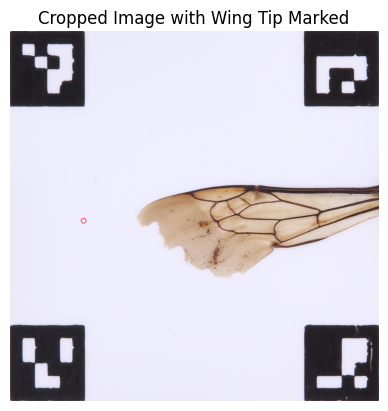

Processing file: UCSB-IZC00028354_R.JPG


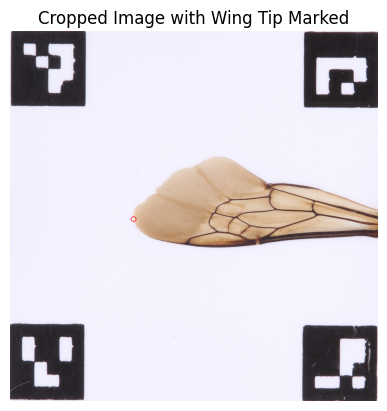

Processing file: UCSB-IZC00047053_L.JPG


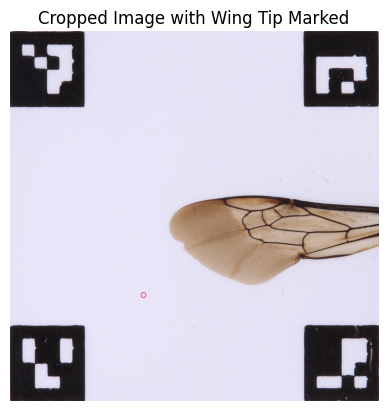

Processing file: UCSB-IZC00033743_R.JPG


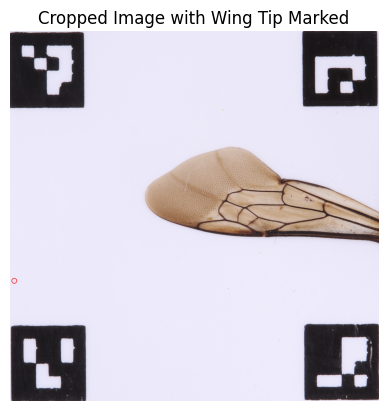

Processing file: UCSB-IZC00009200_R.JPG


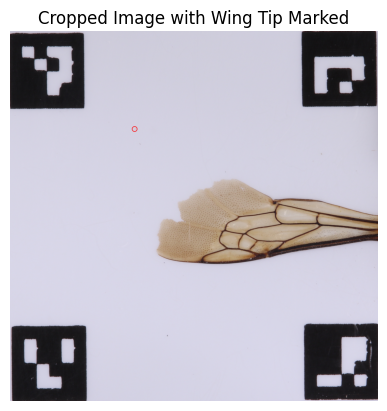

Processing file: UCSB-IZC00009790_R.JPG


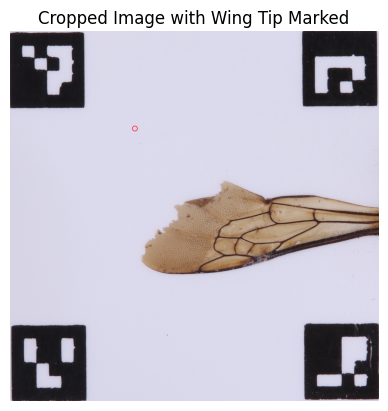

Processing file: UCSB-IZC00010287_L.JPG


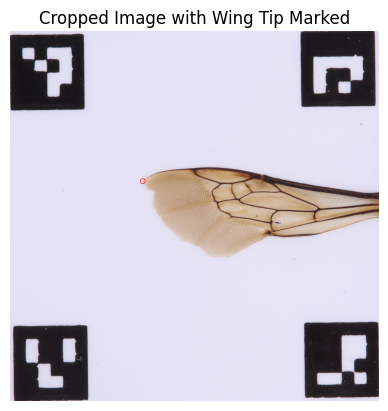

Processing file: UCSB-IZC00033743_L.JPG


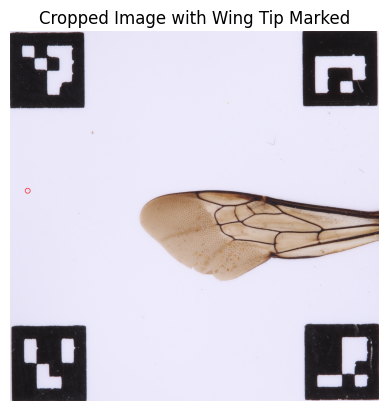

Processing file: UCSB-IZC00009790_L.JPG


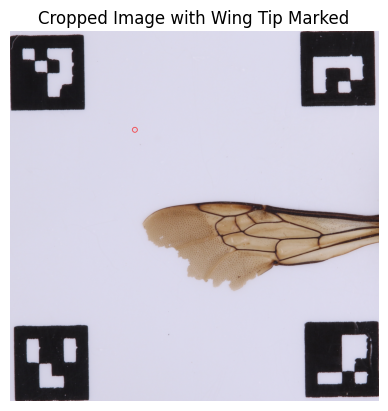

Processing file: UCSB-IZC00010287_R.JPG


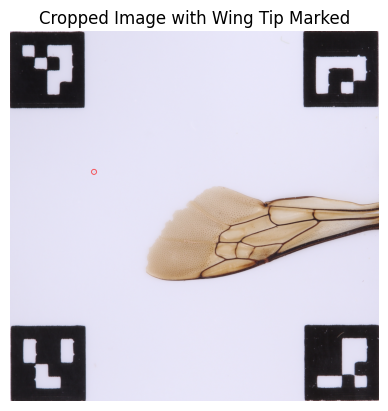

Processing file: UCSB-IZC00041391_R.JPG


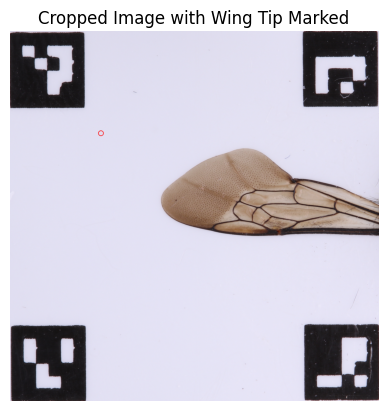

Processing file: UCSB-IZC00014915_R.JPG


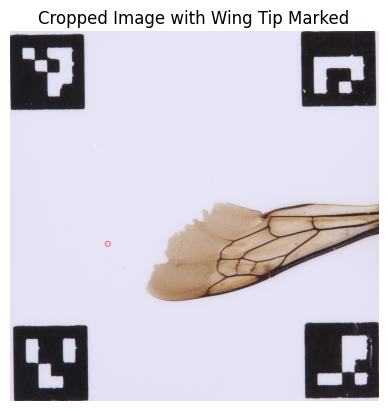

Processing file: UCSB-IZC00028354_L.JPG


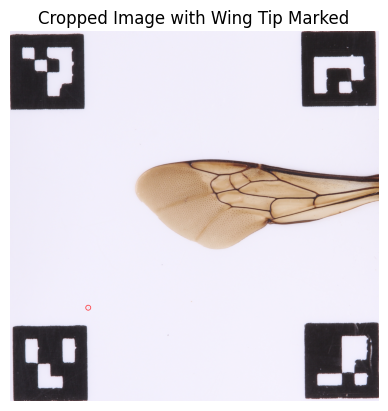

Processing file: UCSB-IZC00047053_R.JPG


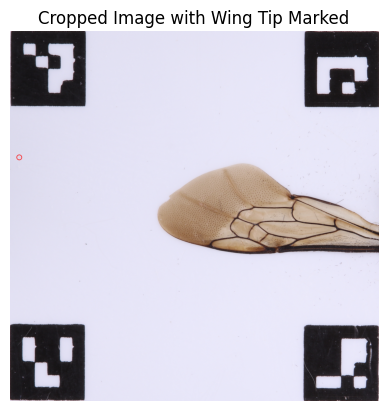

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Eucera frater albopilosa
Processing file: UCSB-IZC00039565_R.JPG


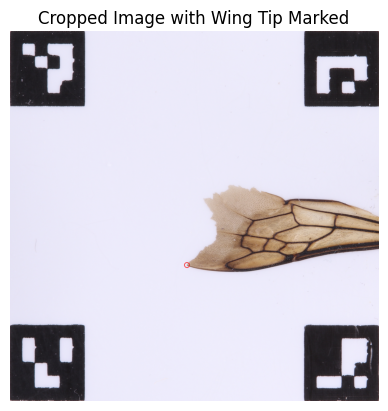

Processing file: UCSB-IZC00040849_L.JPG


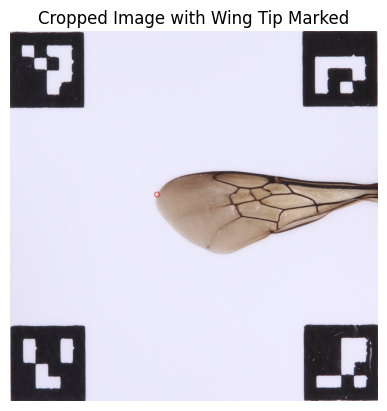

Processing file: UCSB-IZC00039565_L.JPG


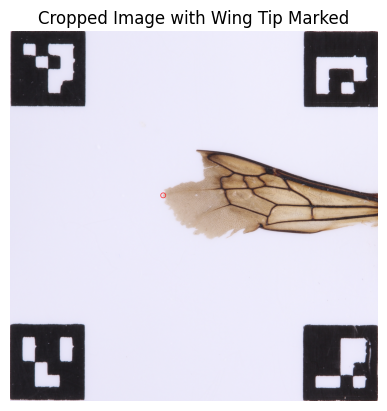

Processing file: UCSB-IZC00040849_R.JPG


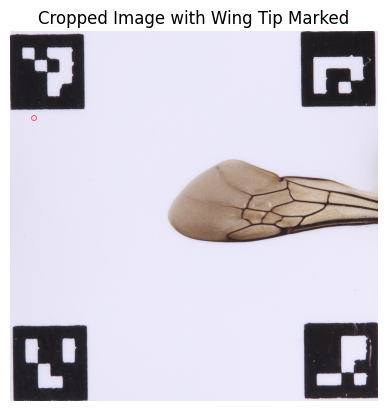

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Bombus californicus
Processing file: UCSB-IZC00010431_L.JPG


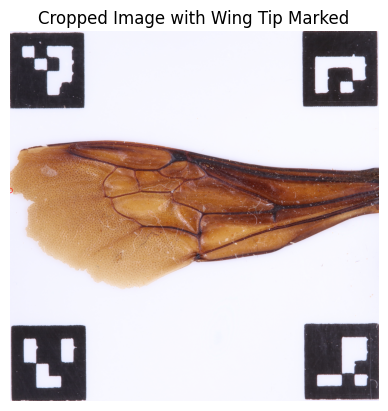

Processing file: UCSB-IZC00010425_R.JPG


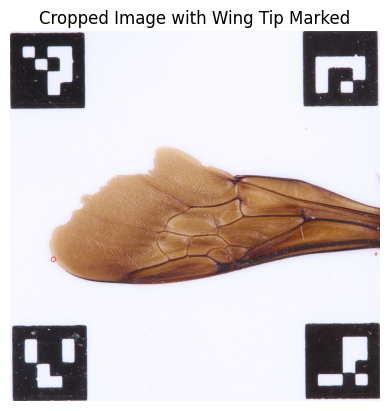

Processing file: UCSB-IZC00010460_R.JPG


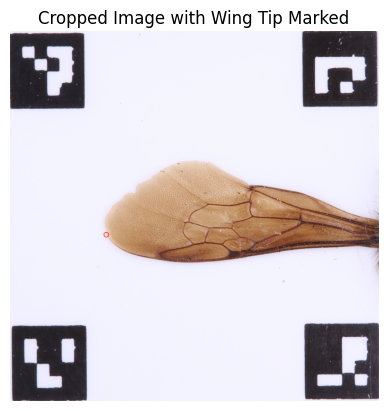

Processing file: UCSB-IZC00041667_L.JPG


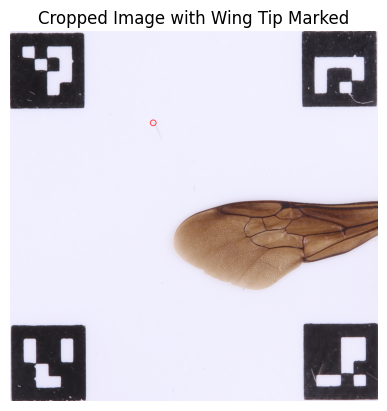

Processing file: UCSB-IZC00028371_R.JPG


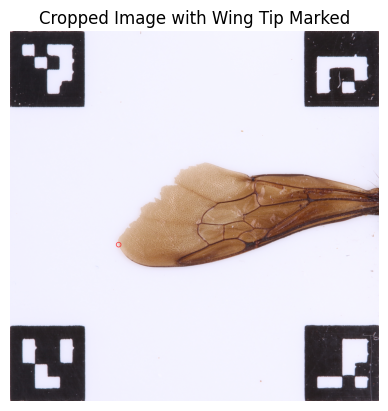

Processing file: UCSB-IZC00010460_L.JPG


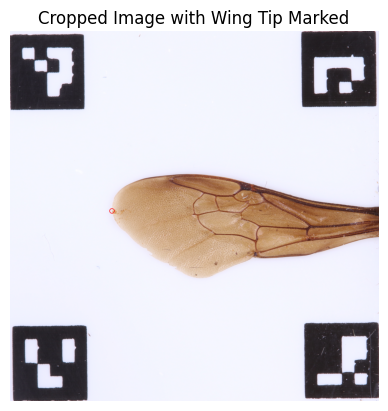

Processing file: UCSB-IZC00010425_L.JPG


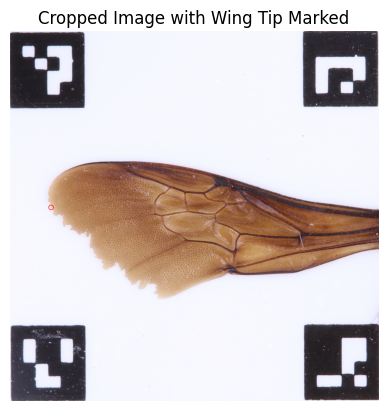

Processing file: UCSB-IZC00041667_R.JPG


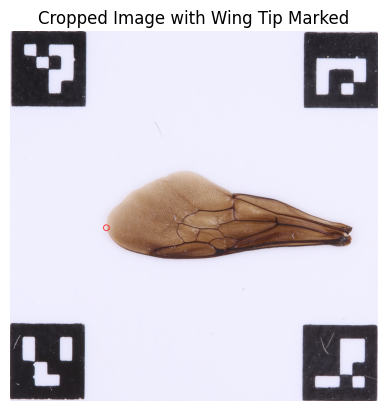

Processing file: UCSB-IZC00028371_L.JPG


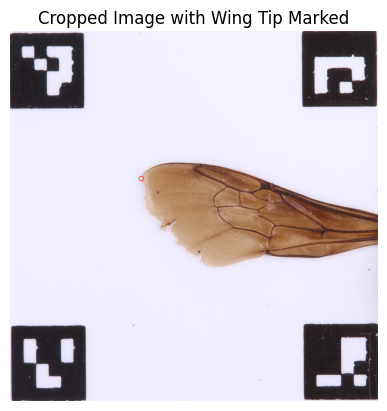

Processing file: UCSB-IZC00010431_R.JPG


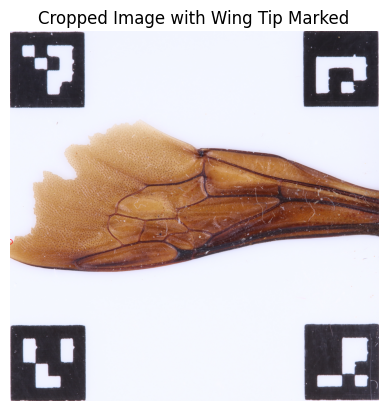

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Bombus melanopygus
Processing file: UCSB-IZC00009120_R.JPG


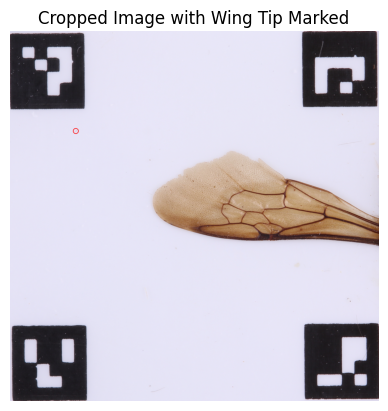

Processing file: UCSB-IZC00028362_L.JPG


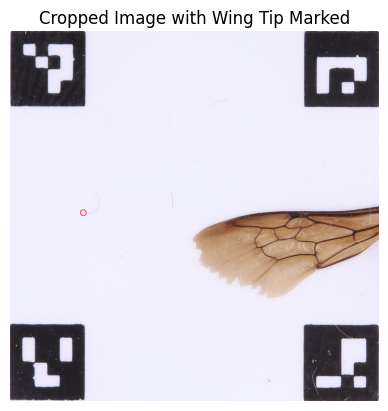

Processing file: UCSB-IZC00028362_R.JPG


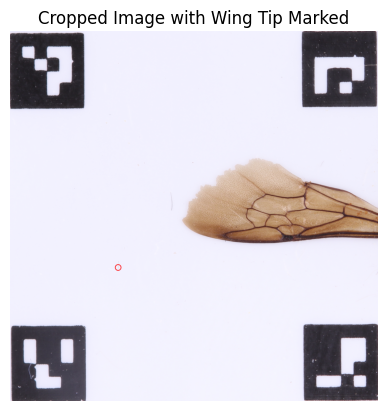

Processing file: UCSB-IZC00009120_L.JPG


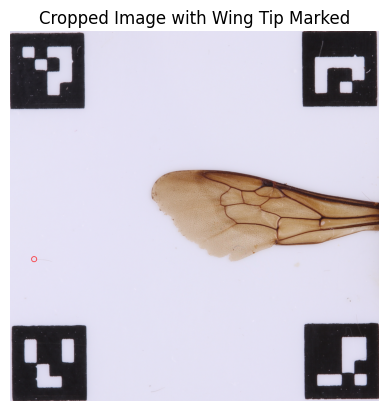

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Diadasia rinconis
Processing file: UCSB-IZC00042912_R.JPG


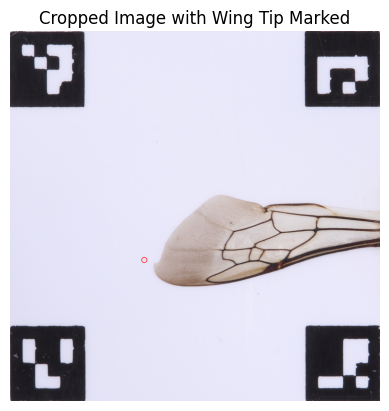

Processing file: UCSB-IZC00040321_R.JPG


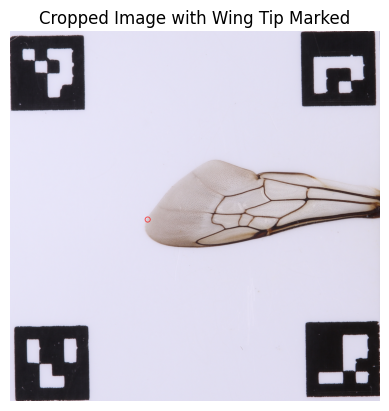

Processing file: UCSB-IZC00039736_L.JPG


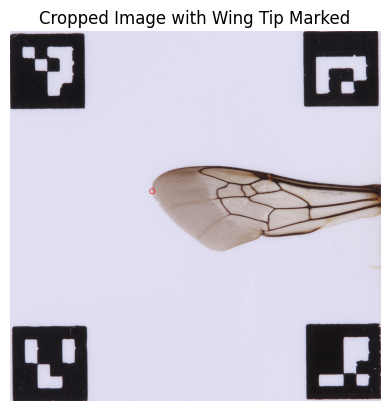

Processing file: UCSB-IZC00039429_L.JPG


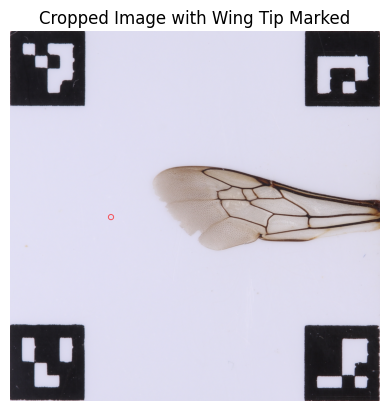

Processing file: UCSB-IZC00047190_L.JPG


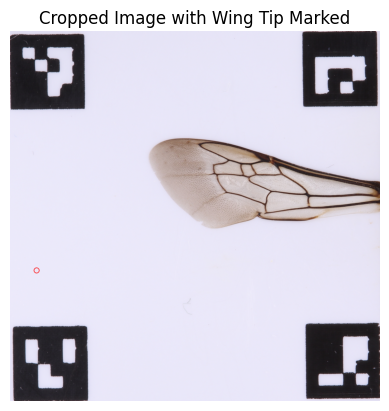

Processing file: UCSB-IZC00037320_R.JPG


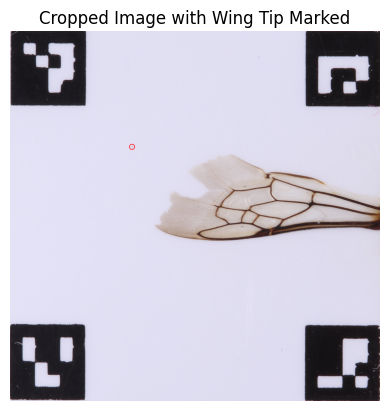

Processing file: UCSB-IZC00046054_L.JPG


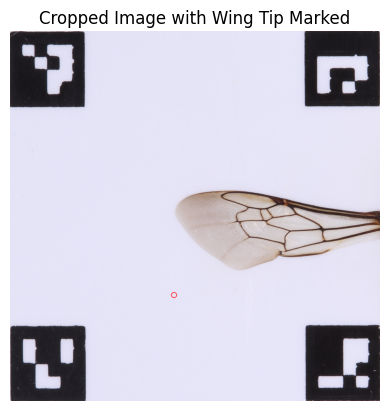

Processing file: UCSB-IZC00039444_R.JPG


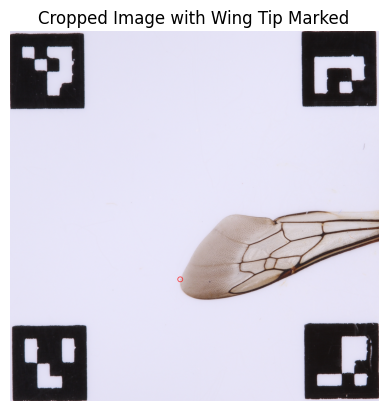

Processing file: UCSB-IZC00039575_L.JPG


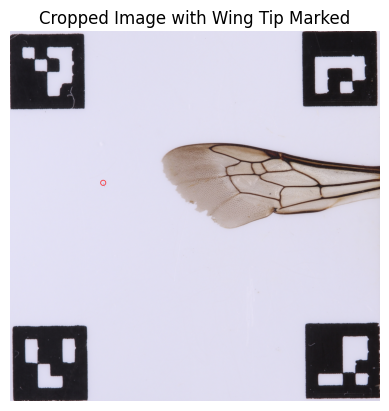

Processing file: UCSB-IZC00039429_R.JPG


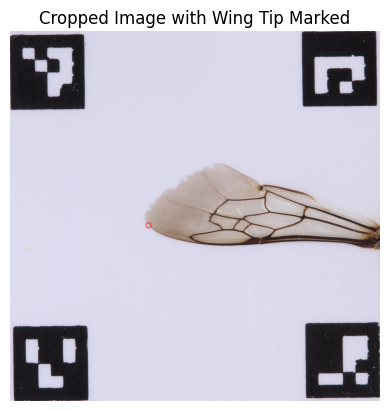

Processing file: UCSB-IZC00047190_R.JPG


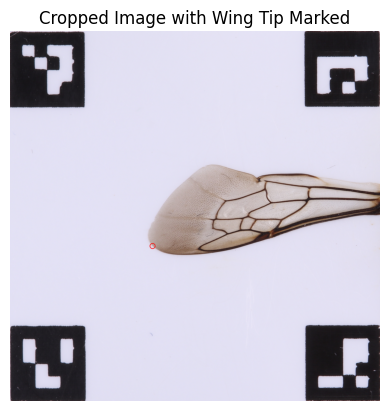

Processing file: UCSB-IZC00037320_L.JPG


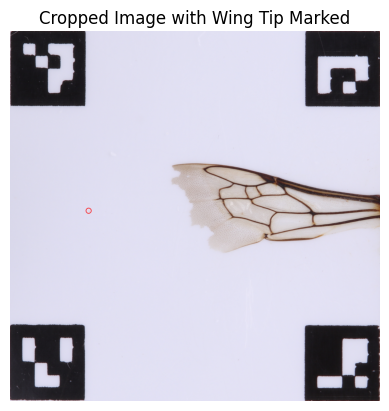

Processing file: UCSB-IZC00046054_R.JPG


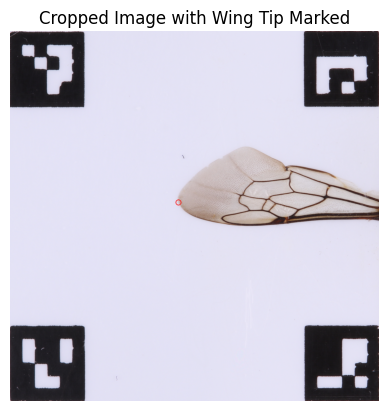

Processing file: UCSB-IZC00039444_L.JPG


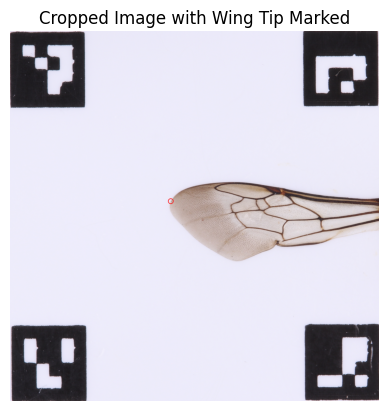

Processing file: UCSB-IZC00039575_R.JPG


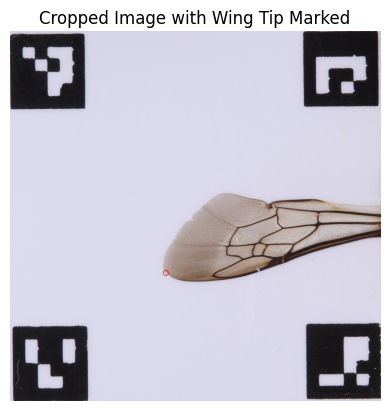

Processing file: UCSB-IZC00042912_L.JPG


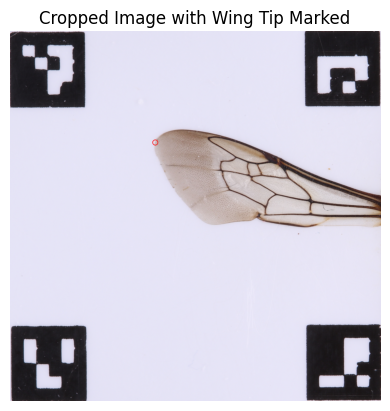

Processing file: UCSB-IZC00040321_L.JPG


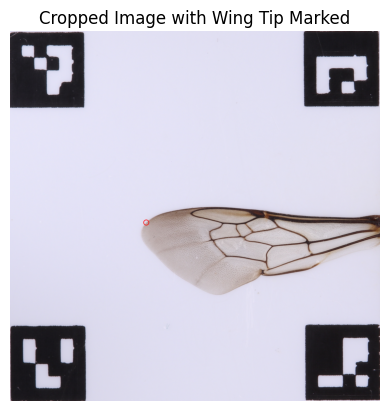

Checking directory: /Users/gwonheum/Desktop/School/PSTAT 197C/data/Bombus vagans
Processing file: UCSB-IZC00033143_L.JPG


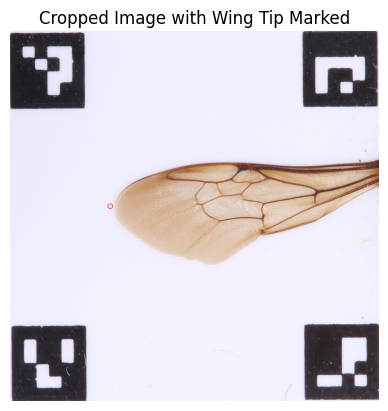

Processing file: UCSB-IZC00033066_L.JPG


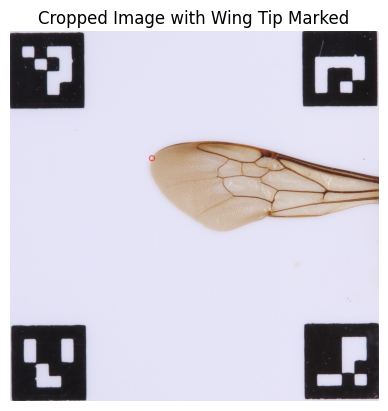

Processing file: UCSB-IZC00033507_R.JPG


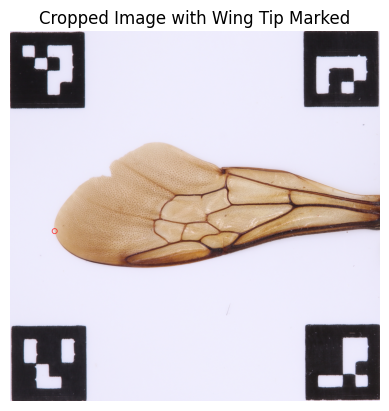

Processing file: UCSB-IZC00033066_R.JPG


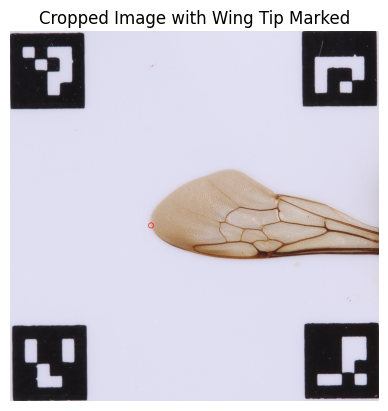

Processing file: UCSB-IZC00033507_L.JPG


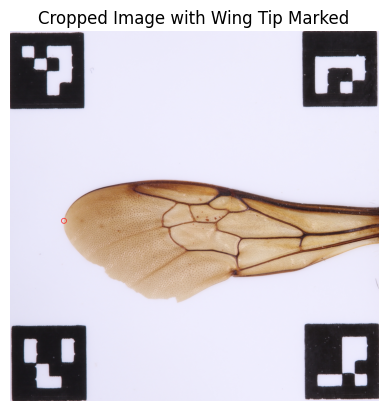

Processing file: UCSB-IZC00033143_R.JPG


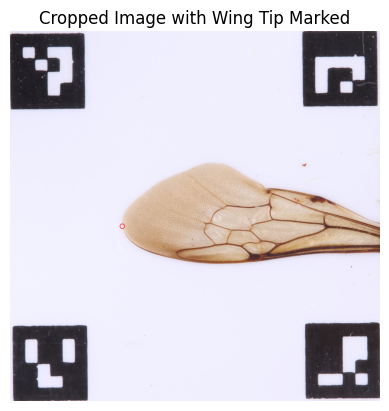

Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Habropoda tristissima_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Diadasia bituberculata_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Osmia atrocyanea_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Bombus sonorus_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Megachile onobrychidis_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Diadasia australis_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Osmia aglaia_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Megachile texana_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Habropoda depressa_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/PSTAT 197C/wing_length/Eucera frater albopilosa_wing_lengths.csv
Saved /Users/gwonheum/Desktop/School/

In [36]:
import os
import pandas as pd

# Base directory where the species folders are located
base_dir = '/Users/gwonheum/Desktop/School/PSTAT 197C/data' 

# Dictionary to hold data for all species
species_data = {}

# Walk through the directory structure
for root, dirs, files in os.walk(base_dir):
    print(f"Checking directory: {root}")  # Debug print
    for file in files:
        if file.lower().endswith('.jpg'):  # Checking with lower case for case-insensitive matching
            species_name = os.path.basename(root)
            image_path = os.path.join(root, file)
            print(f"Processing file: {file}")  # Debug print
            
            try:
                # Process the image and calculate wing length
                pixels_per_mm, marker_size_pixels, corners = calculate_pixel_scale_on_downsampled(image_path)
                cropped_image = crop_image_to_markers(cv2.imread(image_path), corners)
                wing_tip_x, wing_tip_y = find_wing_tip(cropped_image, pixels_per_mm)
                wing_length_mm = calculate_wing_length(cropped_image, wing_tip_x, pixels_per_mm)
                
                # Store the results
                if species_name not in species_data:
                    species_data[species_name] = []
                species_data[species_name].append({
                    'Image': file,
                    'Wing Length (mm)': wing_length_mm
                })
                
            except ValueError as e:
                print(f"Error processing image {file}: {e}")

# Save directory
save_dir = '/Users/gwonheum/Desktop/School/PSTAT 197C/wing_length'  # Directory to save CSV files

# Convert the dictionary to Pandas DataFrames and save as CSV
for species, data in species_data.items():
    df = pd.DataFrame(data)
    csv_path = os.path.join(save_dir, f'{species}_wing_lengths.csv')  # Path to save CSV file
    df.to_csv(csv_path, index=False)
    print(f"Saved {csv_path}")

image_count = 0  # Counter for the number of images processed

# Walk through the directory structure
for root, dirs, files in os.walk(base_dir):
    for file in files:
        if file.lower().endswith('.jpg'):  # Checking with lower case for case-insensitive matching
            image_count += 1  # Increment the image counter

# Print out the total number of images processed
print(f"Total number of images processed: {image_count}")

Saved CSV file to /Users/gwonheum/Desktop/School/PSTAT 197C/all_species_wing_lengths.csv
